## Chromaticity Spaces and Illuminate Spectral Ratio  
This notebook implements various aspects of Maxwell's RoadVision Paper

___ 
### Packages

In [413]:
import cv2  
import pandas as pd  
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from pathlib import Path


___
### Set Up Paths

In [414]:
HOME = Path.cwd()
PATH_TO_DATA_FOLDER = HOME / "data" / "folder_8" / "done"
PATH_TO_ANNOTATIONS_CSV =  HOME / "data" / "folder_8"
img_file =  "wenqing_fan_086.tif" #"wenqing_fan_0101.tif" # "walsh_john_035.tif" 
annotations_csv_file = "annotation_folder_8.csv"
epsilon = 1e-10 # to be used to avoid dividing by zero


___ 
### Read In Test Image

In [415]:
img = cv2.imread(str(PATH_TO_DATA_FOLDER) + "/" + img_file)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


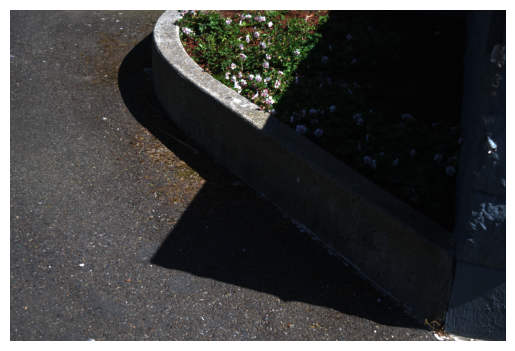

In [416]:
plt.imshow(img)
plt.axis("off");

In [417]:
img.dtype

dtype('uint8')

___
### Convert ```img``` to Standard Chromaticity Space

$$ (\hat{r}, \hat{g}) = \bigg(\frac{R}{(R + G + B)}, \frac{G}{(R + G + B)}\bigg) $$

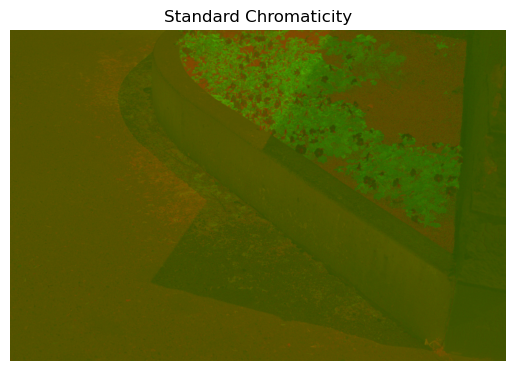

In [418]:
def convert_img_to_rg_chromaticity(img: np.array, epsilon: float = 1e-10, rg_only=False) -> np.array:
    """  
    Generates the rg chromaticity image from an RGB image.

    Parameters:
    -----------
    img : np.array
        Input RGB image as a 3D NumPy array with shape (H, W, 3).
    epsilon : float, optional (default=1e-10)
        A small value added to avoid division by zero.

    Returns:
    --------
    chromaticity_image : np.array
        Chromaticity image as a 3D NumPy array with shape (H, W, 3).
        The third (blue) channel is filled with zeros for visualization.
    
    Explanation:
    ------------
    This function converts an RGB image into rg chromaticity space, 
    where the r and g channels represent the proportion of red and green 
    in each pixel relative to the total pixel intensity. The blue channel is 
    set to zero to highlight the r and g components.
    """

    # Ensure floating-point precision
    img = img.astype(np.float32)
    
    # Compute the sum across channels
    rgb_sum = img.sum(axis=2, keepdims=True) + epsilon  # Avoid division by zero
    
    # Normalize to chromaticity space
    chromaticity = img / (rgb_sum + epsilon)
    
    if rg_only:
        # Extract the r and g channels
        r_channel = chromaticity[:, :, 0]
        g_channel = chromaticity[:, :, 1]

        # Add a blue channel of zeros for visualization
        chromaticity = np.stack((r_channel, g_channel, np.zeros_like(r_channel)), axis=2)

    # Ensure values are clipped and scaled properly
    chromaticity = np.clip(chromaticity, 0, 1)

    # Convert to a displayable range [0, 255]
    chromaticity_img = (chromaticity * 255).astype(np.uint8)

    return chromaticity_img

def display_image(img:np.array, title:str) -> None:
    """ 
    Displays an image using mayplotlib

    Parameters:
    -----------
    img : np.array
        Image to plot using matplotlib. Must be in RGB colorspace.
    title : str
        Plot title.

    Returns:
    --------
    None
    """
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
    plt.show();


chromaticity_image = convert_img_to_rg_chromaticity(img, rg_only=True)
display_image(chromaticity_image, "Standard Chromaticity")

___
### Estimate Illuminate Spectral Direction  
This requires lit and shadow pixels

___ 
### Read In CSV of Lit & Shadowed Pixels

In [419]:
annotations_df = pd.read_csv(str(PATH_TO_ANNOTATIONS_CSV) + "/" + annotations_csv_file, index_col = "filename")
annotations_df.head()


,lit_row1,lit_col1,shad_row1,shad_col1,lit_row2,lit_col2,shad_row2,shad_col2,lit_row3,lit_col3,...,shad_row4,shad_col4,lit_row5,lit_col5,shad_row5,shad_col5,lit_row6,lit_col6,shad_row6,shad_col6
filename,,,,,,,,,,,,,,,,,,,,,
walsh_john_001.tif,682,395,649,485,693,433,664,513,737,461,...,683,709,732,710,688,759,702,338,659,429
walsh_john_015.tif,788,317,764,385,291,166,282,230,348,168,...,695,330,898,413,879,451,446,814,438,881
wenqing_fan_010.tif,670,156,684,235,709,142,745,195,754,112,...,741,668,650,580,650,675,477,635,481,748
wenqing_fan_004.tif,927,861,802,789,920,998,808,838,363,916,...,395,959,365,1036,407,1004,155,894,221,606
wenqing_fan_038.tif,692,400,599,404,708,463,570,465,724,537,...,557,648,741,346,765,191,689,611,635,619


### Get Pixel Coordinates  
This will extract the lit and shadow pixel coordinates from the annotations csv

In [420]:
def get_lit_shadow_pixel_coordinates(annotations_df:pd.DataFrame, image_file_name:str) -> tuple:
    """  
    Extracts the lit and shadow pixel locations from the annoations df.
    Note: filename has to be set as the index for annotation df
    """
    # Extract annotations for image of interest
    image_annotations = annotations_df.loc[image_file_name]

    # Extract lit and shadow pixels
    lit_pixels = [
        (image_annotations[f"lit_row{i}"], image_annotations[f"lit_col{i}"])
        for i in range(1, 7)
    ]
    shadow_pixels = [
        (image_annotations[f"shad_row{i}"], image_annotations[f"shad_col{i}"])
        for i in range(1, 7)
    ]
    return lit_pixels, shadow_pixels

lit_pixels, shadow_pixels = get_lit_shadow_pixel_coordinates(annotations_df, img_file)

print(f"Lit pixels: {lit_pixels}")
print(f"Shadow Pixels: {shadow_pixels}")


Lit pixels: [(309, 735), (281, 692), (862, 532), (882, 574), (839, 484), (904, 675)]
Shadow Pixels: [(377, 821), (411, 875), (764, 582), (792, 629), (759, 536), (811, 693)]


### Inspect the Annotations

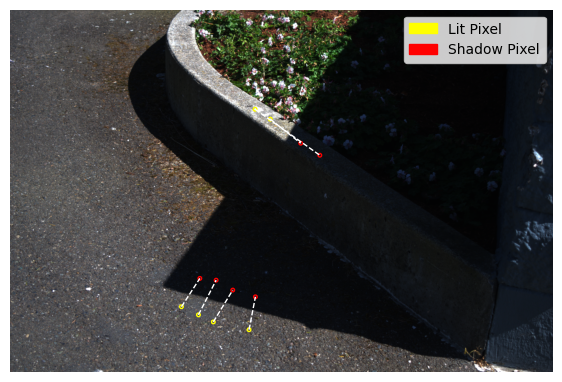

In [421]:
def inspect_annotations(img:np.array, lit_pixels:list, shadow_pixels:list) -> None:
    """  
    Displays the image with lit and shadow pixels highlighted
    """
    fig, ax = plt.subplots(figsize = (7, 12))
    ax.imshow(img)

    # Add circles around lit pixels
    for (y, x) in lit_pixels:
        circle = patches.Circle((x, y), radius=5, edgecolor='yellow', facecolor='none', linewidth=1, label='Lit Pixel')
        ax.add_patch(circle)

    # Add circles arond the shadow pixels
    for (y, x) in shadow_pixels:
        circle = patches.Circle((x, y), radius=5, edgecolor='red', facecolor='none', linewidth=1, label='Shadow Pixel')
        ax.add_patch(circle)

    # Draw lines between lit and shadow pixel pairs
    for (y1, x1), (y2, x2) in zip(lit_pixels, shadow_pixels):
        ax.plot([x1, x2], [y1, y2], linestyle='--', color='white', linewidth=1)

    # Add the legend
    handles = [
        patches.Patch(color='yellow', label='Lit Pixel'),
        patches.Patch(color='red', label='Shadow Pixel')
    ]
    plt.legend(handles = handles)
    plt.axis('off')
    plt.show()

inspect_annotations(img, lit_pixels, shadow_pixels)


In [422]:
print(lit_pixels)
print(shadow_pixels)

[(309, 735), (281, 692), (862, 532), (882, 574), (839, 484), (904, 675)]
[(377, 821), (411, 875), (764, 582), (792, 629), (759, 536), (811, 693)]


### Convert Image to log space
___

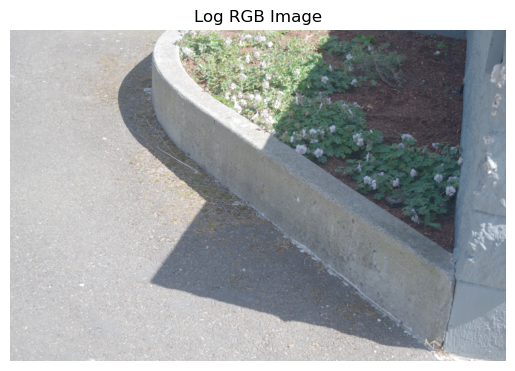

In [423]:

def convert_img_to_log_space(img: np.array, epsilon=1e-10) -> np.array:
    """Takes image and converts to log space, then normalizes"""
    # COnvert to log space
    log_rgb = np.log(img + epsilon)

    # Normalize to [0, 1] range
    log_rgb_normalized = (log_rgb - log_rgb.min()) / (log_rgb.max() - log_rgb.min())
    #log_rgb_normalized *= 255

    # Clip to ensure valid pixel range
    #log_rgb_normalized = np.clip(log_rgb_normalized, 0, 255)
    log_rgb_normalized = np.clip(log_rgb_normalized, 0, 1)

    # Convert to uint8 for display
    #log_rgb_normalized = log_rgb_normalized.astype(np.uint8)

    return log_rgb_normalized

log_rgb = convert_img_to_log_space(img)
# Display the image
display_image(log_rgb, "Log RGB Image")
#display_image(log_rgb_normalized, "Normalized Log RGB Image")



### Compute the ISD  
This is from 4.1 of Lightbrush:  

4.1 Base Constraints and Linear System Representation
4.1.1 Illumination Spectral Direction. The only required user input
is an estimate of the illumination spectral direction. The ISD
defines the log chromaticity space for the log-chromaticity clustering
step. While automated schemes for detecting the ISD are
possible, we opt to allow simple user control. Lightbrush includes a
lit-dark pair tool that consists of two linked squares (Figure 4(a)).
The user places one square in a lit area of a material and the other
square in a shadowed area of the same material. The system uses
the average value under each block to estimate the ISD. If the user
specifies multiple lit-dark pairs, they can tell Lightbrush to average
the estimated ISDs or use a local adaptation scheme to deal with
changing illumination conditions within the scene.

In [424]:
def compute_isd(log_rgb: np.array, lit_pixels: list, shadow_pixels: list) -> np.array:
    """
    Computes the Illumination Subspace Direction (ISD) vector 
    by comparing pixel values between lit and shadow regions in log RGB space.

    Parameters:
    -----------
    log_rgb : np.array
        The log transformed image.
    lit_pixels : list of tuples
        List of (x, y) coordinates representing pixels in the lit region.
    
    shadow_pixels : list of tuples
        List of (x, y) coordinates representing pixels in the shadow region.

    Returns:
    --------
    isd : np.array
        A 3-element vector representing the unit-normalized Illumination Subspace Direction (ISD).
        This vector indicates the direction of change in RGB values caused by illumination.

    Explanation:
    ------------
    - The ISD vector captures the differences between lit and shadow regions.
    - This function uses the mean RGB difference between these regions to find
      the vector in log RGB space that represents the change in illumination.
    - It normalizes the mean difference to ensure the ISD is a unit vector.

    Notes:
    ------
    - The log RGB values (log_rgb) must already be computed prior to calling this function.
    - Normalization ensures that the ISD vector is scale-independent, which is 
      essential for proper projection in chromaticity-based models.
    """
    
    # Unpack the tuples of pixel coordinates
    lit_x, lit_y = zip(*lit_pixels) 
    shadow_x, shadow_y = zip(*shadow_pixels)

    # Extract the lit and shadow pixel values
    lit_values = log_rgb[lit_x, lit_y]
    shadow_values = log_rgb[shadow_x, shadow_y]

    # Get pixel diffs
    pixel_diff = lit_values - shadow_values

    # Use equation #4 from Bruce's RoadVision Paper
    mean_diff = np.mean(pixel_diff, axis=0)
    isd = mean_diff / np.linalg.norm(mean_diff)
    
    return isd

isd = compute_isd(log_rgb, lit_pixels, shadow_pixels)

### Inspect ISD

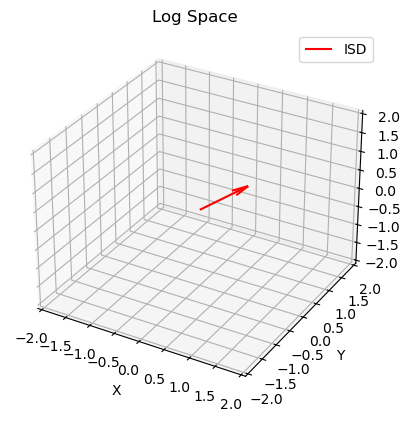

In [425]:
def plot_isd_vector_3D(mean_isd:np.array) -> None:
    """  
    Displays the mean ISD vector
    """
    # Set up 3D fig
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    # Plot the ISD vector - This is through the origin, idk for sure about this
    ax.quiver(0, 0, 0, mean_isd[0], mean_isd[1], mean_isd[2], color='r', arrow_length_ratio=0.3, label="ISD")

    # Set limits for the axes
    ax.set_xlim([-2, 2])
    ax.set_ylim([-2, 2])
    ax.set_zlim([-2, 2])

    # Set labels
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title("Log Space")

    # Add a legend
    ax.legend();

plot_isd_vector_3D(isd)

### Project Log RGB onto ISD  
$$projection = \vec{ISD} \cdot IMG_{log}$$  

This produces a scalar value for each pixel representing how much of the pixel intensity is along the ISD

In [426]:
projection = np.dot(log_rgb, isd)

# Print the shape to verify
print(f"Projection shape: {projection.shape}")
print(f"Projection example: {projection.ravel()[:5]}")

Projection shape: (1024, 1533)
Projection example: [1.31040564 1.31096897 1.31456215 1.30738393 1.29404678]


### Generate Projection Matrix

In [427]:
# projection[..., np.newaxis] reshapes the scalar projection array to have shape (H, W, 1)
# # broadcast across the RGB channels.
projection_matrix = projection[..., np.newaxis] * isd


# Display results
print(f"Projection vector shape: {projection_matrix.shape}")
print(f"Projection vector example (first pixel): {projection_matrix[0, 0]}")



Projection vector shape: (1024, 1533, 3)
Projection vector example (first pixel): [0.84536568 0.75236991 0.66065069]


### Subtract Projection Matrix

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


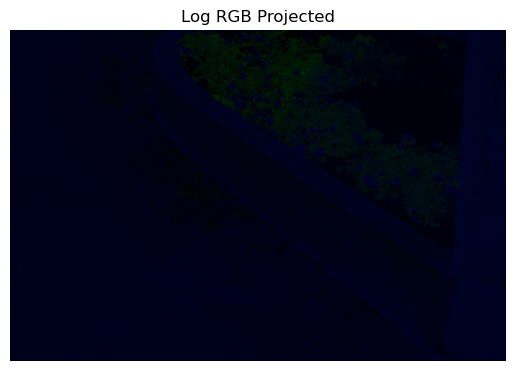

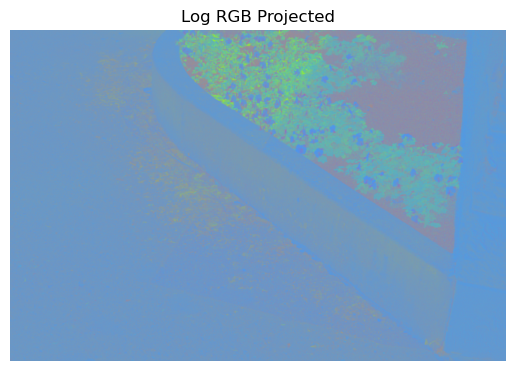

In [428]:
projected_log_rgb = log_rgb - projection_matrix
display_image(projected_log_rgb, "Log RGB Projected")

def ensure_normalized(projected_log_rgb):
    """
    Ensures the projected log RGB image stays within the [0, 1] range.
    """
    # Handle NaNs if present
    projected_log_rgb = np.nan_to_num(projected_log_rgb, nan=0.0)
    
    # Normalize to [0, 1] range
    min_val = projected_log_rgb.min()
    max_val = projected_log_rgb.max()
    normalized = (projected_log_rgb - min_val) / (max_val - min_val + 1e-10)

    # Ensure the data type is float32 for precision
    return normalized.astype(np.float32)

projected_log_rgb = ensure_normalized(projected_log_rgb)
display_image(projected_log_rgb, "Log RGB Projected")


### Visualizations of Log Space

In [429]:
def plot_log_space(img: np.array, mean_isd: np.array, plot_plane=True, plot_pixels=True, plot_projection=True) -> None:
    """
    Displays the RGB pixel values of an image in 3D.
    
    Parameters:
    -----------
    img : np.array
        RGB image as a 3D array (H, W, 3).

    """
    # log transform image
    #log_img = np.log(img + epsilon)
    log_img = convert_img_to_log_space(img)

    # Set up 3D figure
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Plot the ISD vector - This is through the origin, idk for sure about this
    ax.quiver(0, 0, 0, mean_isd[0], mean_isd[1], mean_isd[2], color='r', arrow_length_ratio=0.3, label = "ISD")

    if plot_plane:
        # Create a grid for the plane centered at the origin, again not sure about the origin
        xx, yy = np.meshgrid(np.linspace(-1, 1, 10), np.linspace(-1, 1, 10))

        # Compute the corresponding z values for the plane
        zz = -(mean_isd[0] * xx + mean_isd[1] * yy) / mean_isd[2]

        # Plot the plane
        ax.plot_surface(xx, yy, zz, alpha=0.5, color='cyan', label = "Plane Orthogonal to ISD")
    
    # Plot each pixel as a point in 3D space with its RGB color
    colors = img.reshape(-1, 3) / 255.0

    if plot_pixels:
        ax.scatter(log_img[:, :, 0], log_img[:, :, 1], log_img[:, :, 2], color=colors, marker='o', s=1, label="Pixel Values")

      # Add the image points
    if plot_projection:
        projection = (log_rgb @ isd)[:, :, np.newaxis] * isd[np.newaxis, np.newaxis, :]
        projected_img = log_rgb - projection

        # Plot the projected points
        ax.scatter(projected_img[:, :, 0], projected_img[:, :, 1], projected_img[:, :, 2], color=colors, alpha=0.1, s=1, label='Projected Points')

    # Set axis labels
    ax.set_xlabel('X (Width)')
    ax.set_ylabel('Y (Height)')
    ax.set_zlabel('Z (Projection)')
    ax.set_title("Log Space")
    ax.legend()

    plt.show()


Plot the plane orthogonal to the ISD - this the the new chromaticity space.

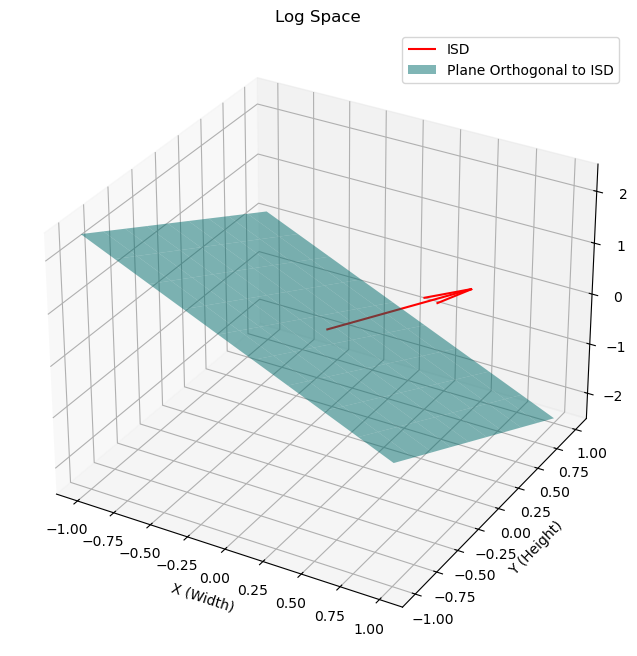

In [430]:
plot_log_space(img, isd, plot_plane=True, plot_pixels=False, plot_projection=False)

THe next image shows the pixel values for the log transformed RGB image.

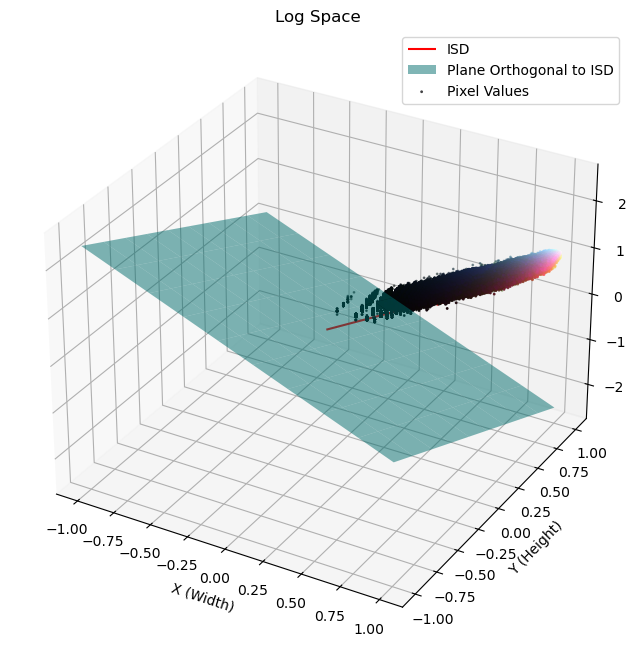

In [431]:
plot_log_space(img, isd, plot_plane=True, plot_pixels=True, plot_projection=False)

The last image shows the project of those pixels onto the log space chromaticity plane.

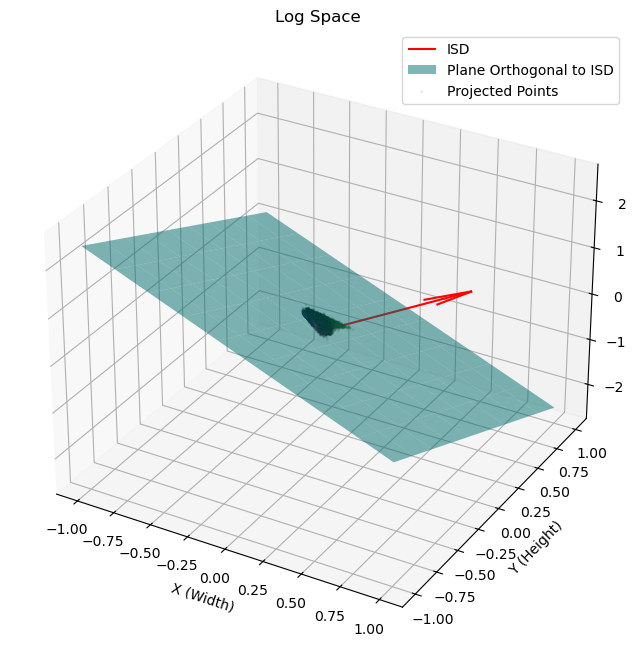

In [432]:
plot_log_space(img, isd, plot_plane=True, plot_pixels=False, plot_projection=True)

### Inspect Projected Image

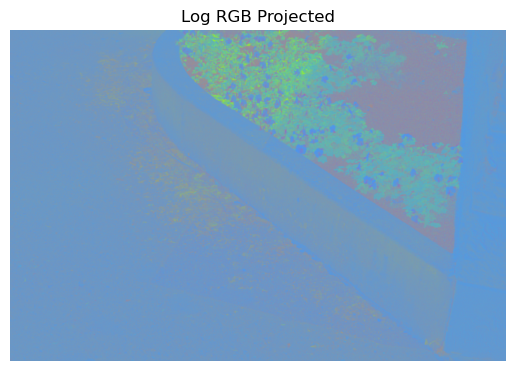

In [433]:
display_image(projected_log_rgb, "Log RGB Projected")

### Compute Log Space Chromaticity



___


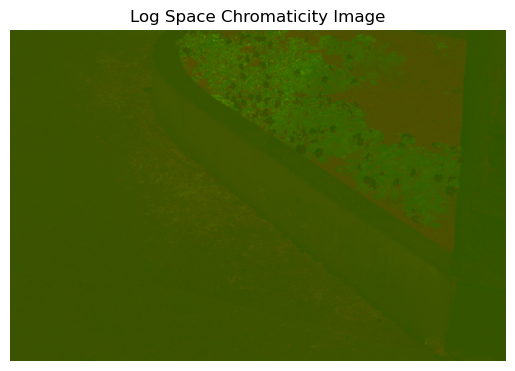

In [434]:
log_space_chromaticity = convert_img_to_rg_chromaticity(projected_log_rgb, rg_only=True)
display_image(log_space_chromaticity, "Log Space Chromaticity Image")

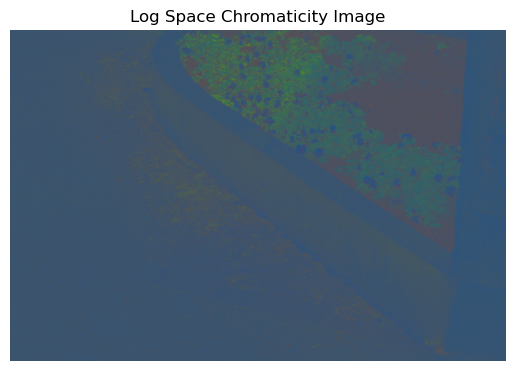

In [435]:
log_space_chromaticity = convert_img_to_rg_chromaticity(projected_log_rgb, rg_only=False)
display_image(log_space_chromaticity, "Log Space Chromaticity Image")

## Show Results

Text(0.5, 1.0, 'Log Space Chromaticity')

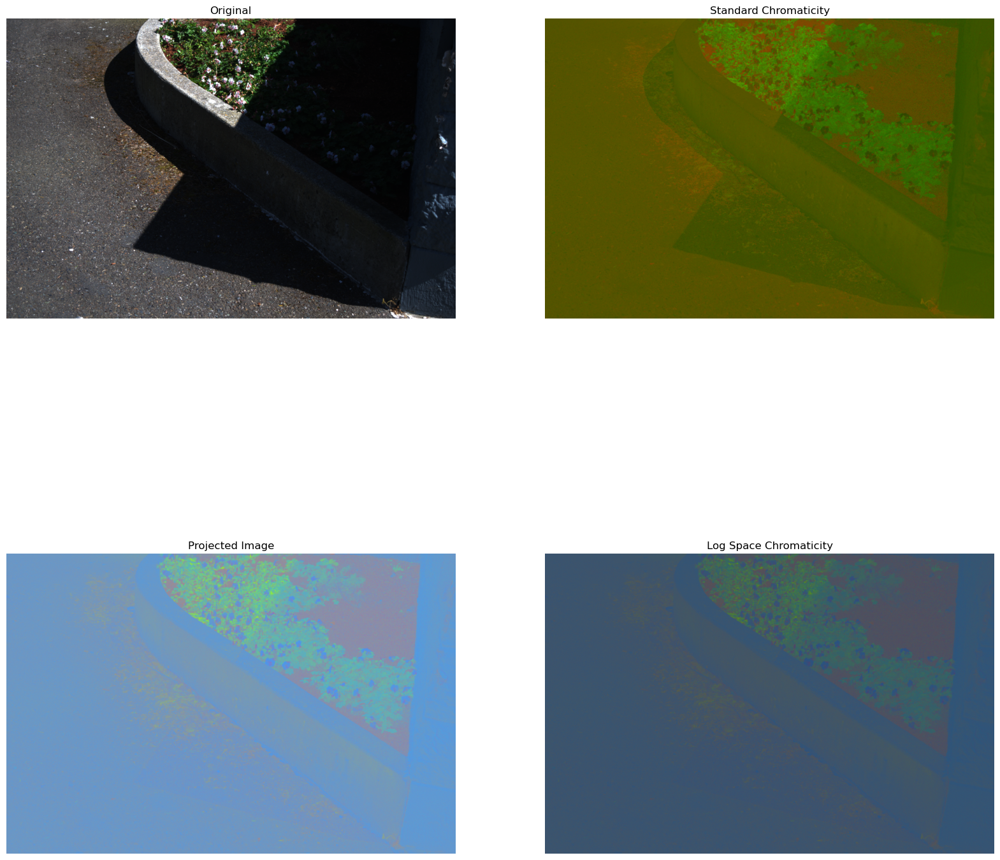

In [436]:
fig, axes = plt.subplots(2,2, figsize = (20, 20))
ax = axes.ravel()
ax[0].imshow(img)
ax[0].axis("off")
ax[0].set_title("Original")
ax[1].imshow(chromaticity_image)
ax[1].axis("off")
ax[1].set_title("Standard Chromaticity")
ax[2].imshow(projected_log_rgb)
ax[2].axis("off")
ax[2].set_title("Projected Image")
ax[3].imshow(log_space_chromaticity)
ax[3].axis("off")
ax[3].set_title("Log Space Chromaticity")

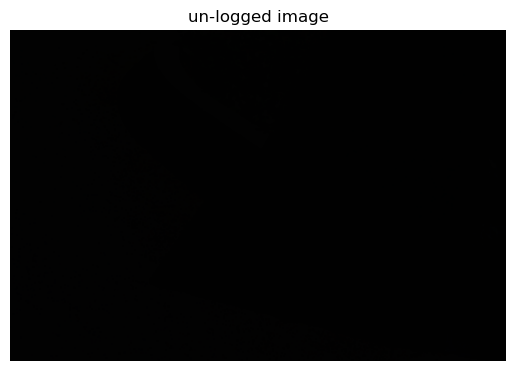

In [437]:
def unlog_image(log_rgb: np.array, epsilon: float = 1e-10) -> np.array:
    """
    Inverse log transformation to recover the original image from log space.
    """
    # Apply the inverse of the log transformation
    img_recovered = np.exp(log_rgb) - epsilon

    # Clip pixel values to ensure valid range [0, 255]
    img_recovered = np.clip(img_recovered, 0, 255)

    # Convert to uint8 for display
    return img_recovered.astype(np.uint8)

display_image(unlog_image(log_rgb), "un-logged image")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB Values:
Max:  255
Min:  1

Log RGB Values:
Max:  5.541263545158818
Min:  1.000000082690371e-10

Lit Values: [[5.40717177 5.35658627 5.31320598]
 [5.54126355 5.54126355 5.54126355]
 [4.11087386 4.20469262 4.40671925]
 [4.30406509 4.17438727 4.15888308]
 [4.46590812 4.27666612 4.24849524]
 [4.11087386 4.02535169 4.11087386]]

Shadow Values: [[2.56494936 2.7080502  2.83321334]
 [2.56494936 2.83321334 2.99573227]
 [2.48490665 2.56494936 2.94443898]
 [2.56494936 2.7080502  3.04452244]
 [2.19722458 2.39789527 2.7080502 ]
 [2.30258509 2.56494936 2.89037176]]

Pixel Difference: [[2.84222241 2.64853607 2.47999263]
 [2.97631419 2.7080502  2.54553127]
 [1.62596721 1.63974326 1.46228027]
 [1.73911574 1.46633707 1.11436065]
 [2.26868354 1.87877085 1.54044504]
 [1.80828877 1.46040233 1.22050211]]

Mean Diff: [2.21009864 1.9669733  1.72718533]

ISD: [0.64511755 0.57415039 0.50415739]

log_space_chromaticity shape: (1024, 1533, 3)


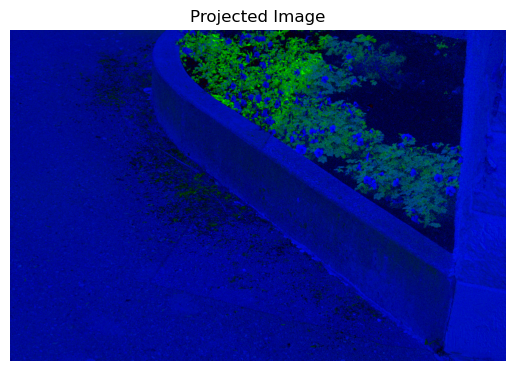

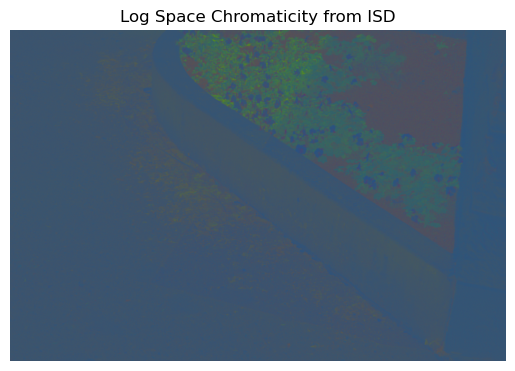

In [438]:
print("RGB Values:")
print("Max: ", np.max(img))
print("Min: ", np.min(img))

# Covert Image to log space
log_rgb = np.log(img + epsilon)
print("\nLog RGB Values:")
print("Max: ", np.max(log_rgb))
print("Min: ", np.min(log_rgb))

# Unpack the tuples of pixel coordinates
lit_x, lit_y = zip(*lit_pixels) 
shadow_x, shadow_y = zip(*shadow_pixels)

# Extract the lit and shadow pixel values
lit_values = log_rgb[lit_x, lit_y]
shadow_values = log_rgb[shadow_x, shadow_y]
pixel_diff = lit_values - shadow_values

print(f"\nLit Values: {lit_values}")
print(f"\nShadow Values: {shadow_values}")
print(f"\nPixel Difference: {pixel_diff}")

mean_diff = np.mean(pixel_diff, axis=0)
print(f"\nMean Diff: {mean_diff}")

# Use equation #4 from Bruce's RoadVision Paper
isd = mean_diff / np.linalg.norm(mean_diff)
print(f"\nISD: {isd}")

# Project out the ISD from the log RGB to create illumination invariant log chromaticity
projection = (log_rgb @ isd)[:, :, np.newaxis] * isd[np.newaxis, np.newaxis, :]
projected_img = log_rgb - projection
print(f"\nlog_space_chromaticity shape: {projected_img.shape}")


# Display the log chromaticity image
plt.imshow(projected_img)
plt.title("Projected Image")
plt.axis('off')
plt.show()

# Extract r and g channels of the log space chromaticity
log_r = projected_img[:, :, 0]
log_g = projected_img[:, :, 1]

# log_space_chromaticity= np.stack((log_r, log_g, np.zeros_like(log_r)), axis=2)
# log_space_chromaticity = convert_img_to_rg_chromaticity(projected_img)

# Display the log chromaticity image
plt.imshow(log_space_chromaticity)
plt.title("Log Space Chromaticity from ISD")
plt.axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'Log Space Chromaticity')

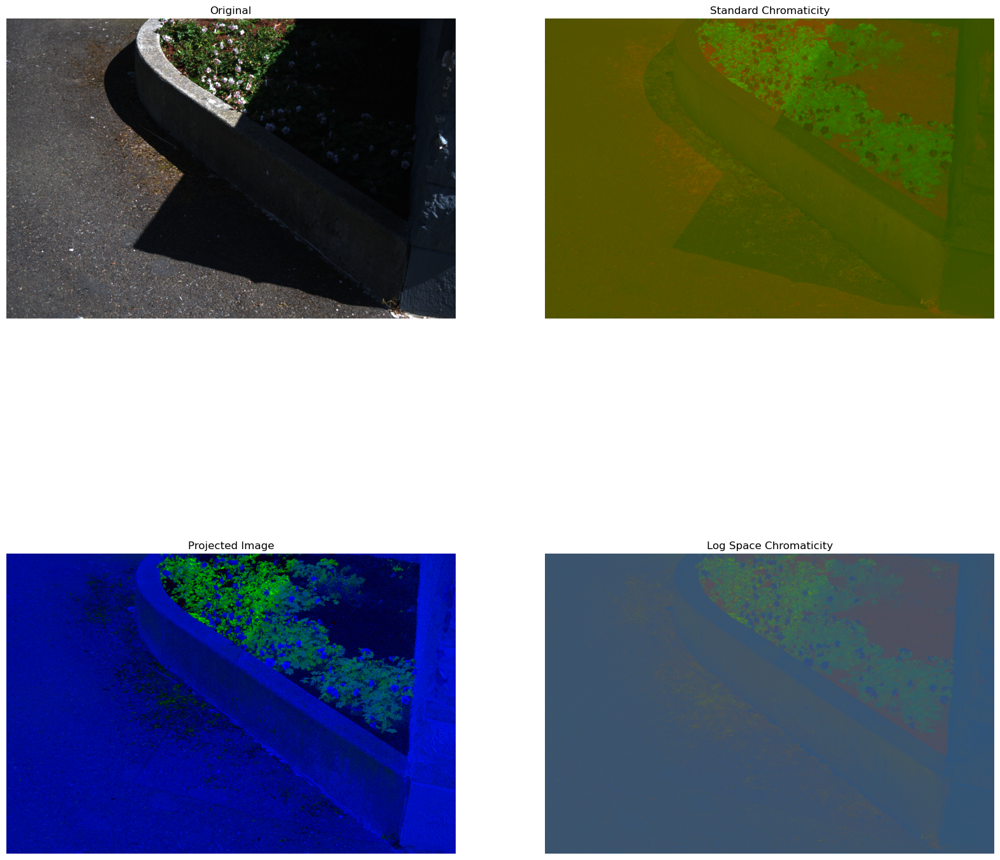

In [439]:
fig, axes = plt.subplots(2,2, figsize = (20, 20))
ax = axes.ravel()
ax[0].imshow(img)
ax[0].axis("off")
ax[0].set_title("Original")
ax[1].imshow(chromaticity_image)
ax[1].axis("off")
ax[1].set_title("Standard Chromaticity")
ax[2].imshow(projected_img)
ax[2].axis("off")
ax[2].set_title("Projected Image")
ax[3].imshow(log_space_chromaticity)
ax[3].axis("off")
ax[3].set_title("Log Space Chromaticity")


In [440]:
import os
from nbconvert import HTMLExporter
import nbformat

# Load the notebook
with open('mike_scratch.ipynb') as f:
    notebook = nbformat.read(f, as_version=4)

# Convert the notebook to HTML
html_exporter = HTMLExporter()
html_data, _ = html_exporter.from_notebook_node(notebook)

# Path to the directory you want to create
dir_path = "htmls/"

# Check if the directory exists and create it if it doesn't
if not os.path.exists(dir_path):
    os.makedirs(dir_path)
    print(f"Directory '{dir_path}' created.")

# Write the output to an HTML file
with open(dir_path + 'mike_scratch.html', 'w') as f:
    f.write(html_data)